In [1]:
import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("C:/Users/user/OneDrive/Desktop/bluestock_mf_capstone/data/processed/cleaned_nav_history.csv")

In [3]:
df

,amfi_code,date,nav
0,100016,2022-01-03,520.4608
1,100016,2022-01-04,515.0971
2,100016,2022-01-05,521.7239
3,100016,2022-01-06,515.7880
4,100016,2022-01-07,515.1639
...,...,...,...
45995,149324,2026-05-25,292.4810
45996,149324,2026-05-26,291.2707
45997,149324,2026-05-27,288.8007
45998,149324,2026-05-28,280.6873


In [4]:
df['date'] = pd.to_datetime(df['date'])

In [5]:
df = df[
    (df['date'] >= '2022-01-01') &
    (df['date'] <= '2026-12-31')
]

In [6]:
fig=go.Figure()

In [7]:
for scheme in df['amfi_code'].unique():

    scheme_df = df[df['amfi_code'] == scheme]

    fig.add_trace(
        go.Scatter(
            x=scheme_df['date'],
            y=scheme_df['nav'],
            mode='lines',
            name=str(scheme),
            line=dict(width=1),
            opacity=0.45
        )
    )

In [8]:
fig.add_vrect(
    x0="2023-01-01",
    x1="2023-12-31",
    fillcolor="green",
    opacity=0.15,
    layer="below",
    line_width=0,
    annotation_text="2023 Bull Run",
    annotation_position="top left")

In [9]:
fig.add_vrect(
    x0="2024-03-01",
    x1="2024-09-30",
    fillcolor="red",
    opacity=0.15,
    layer="below",
    line_width=0,
    annotation_text="2024 Market Correction",
    annotation_position="top left")

In [10]:
fig.update_layout(
    title="Daily NAV Trend Analysis (2022–2026)",
    xaxis_title="Date",
    yaxis_title="NAV",
    hovermode="x unified",
    template="plotly_white",
    height=700,
    width=1400
)


In [11]:
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [22]:
df=pd.read_csv("C:/Users/user/OneDrive/Desktop/bluestock_mf_capstone/data/raw data/03_aum_by_fund_house.csv")
df

,date,fund_house,aum_lakh_crore,aum_crore,num_schemes
0,2022-03-31,SBI Mutual Fund,6.05,605000,186
1,2022-03-31,ICICI Prudential MF,4.65,465000,216
2,2022-03-31,HDFC Mutual Fund,4.35,435000,195
3,2022-03-31,Nippon India MF,2.70,270000,177
4,2022-03-31,Kotak Mahindra MF,2.70,270000,168
...,...,...,...,...,...
85,2025-12-31,Aditya Birla Sun Life MF,4.60,460000,199
86,2025-12-31,Axis Mutual Fund,3.50,350000,95
87,2025-12-31,UTI Mutual Fund,4.10,410000,142
88,2025-12-31,Mirae Asset MF,2.90,290000,56


In [23]:
df.columns = df.columns.str.strip()

In [42]:
df.rename(columns={
    'fund_hous': 'fund_house',
    'aum_lakh_': 'aum_lakh_crore',
    'num_sche': 'num_schemes'
}, inplace=True)


In [43]:
df['date'] = pd.to_datetime(
    df['date'],
    dayfirst=True
)

In [44]:
df['year'] = df['date'].dt.year

In [45]:

df['aum_lakh_crore'] = pd.to_numeric(
    df['aum_lakh_crore'],
    errors='coerce'
)

In [46]:
df = df.dropna(subset=['aum_lakh_crore'])

In [47]:
df = df[
    (df['year'] >= 2022) &
    (df['year'] <= 2025)
]

In [48]:
yearly_aum = (
    df.groupby(['year', 'fund_house'])
    .last()
    .reset_index()
)

In [49]:
latest = (
    yearly_aum[yearly_aum['year'] == 2025]
    .sort_values(
        by='aum_lakh_crore',
        ascending=False
    )
)
top_funds = latest['fund_house'].head(8)
top_funds

38             SBI Mutual Fund
34         ICICI Prudential MF
33            HDFC Mutual Fund
37             Nippon India MF
35           Kotak Mahindra MF
30    Aditya Birla Sun Life MF
39             UTI Mutual Fund
31            Axis Mutual Fund
Name: fund_house, dtype: object

In [50]:
yearly_aum = yearly_aum[
    yearly_aum['fund_house'].isin(top_funds)
]

In [51]:
plt.figure(figsize=(16,8))

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

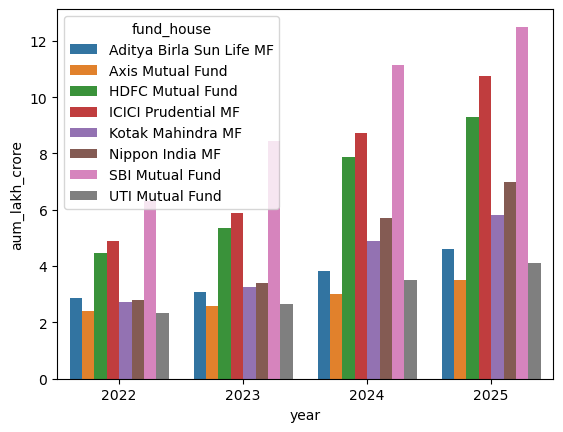

In [52]:
ax = sns.barplot(
    data=yearly_aum,
    x='year',
    y='aum_lakh_crore',
    hue='fund_house'
)

In [53]:
df=pd.read_csv(r"C:/Users/user/OneDrive/Desktop\bluestock_mf_capstone\data\raw data\04_monthly_sip_inflows.csv")

In [54]:
df

,month,sip_inflow_crore,active_sip_accounts_crore,new_sip_accounts_lakh,sip_aum_lakh_crore,yoy_growth_pct
0,2022-01,11517,4.91,9.10,4.80,NaN
1,2022-02,11438,4.93,8.20,4.85,NaN
2,2022-03,12328,5.09,10.50,5.01,NaN
3,2022-04,11863,5.48,9.52,5.12,NaN
4,2022-05,12286,5.55,8.10,5.15,NaN
5,2022-06,12276,5.60,7.50,5.18,NaN
6,2022-07,12140,5.65,9.21,5.25,NaN
7,2022-08,12694,5.71,8.90,5.31,NaN
8,2022-09,12976,5.80,9.40,5.41,NaN
9,2022-10,13040,5.93,9.52,5.55,NaN


In [55]:
df.columns = df.columns.str.strip()

In [56]:
df.columns

Index(['month', 'sip_inflow_crore', 'active_sip_accounts_crore',
       'new_sip_accounts_lakh', 'sip_aum_lakh_crore', 'yoy_growth_pct'],
      dtype='object')

In [57]:
df['month'] = pd.to_datetime(df['month'])

In [59]:
df['sip_inflow_crore'] = pd.to_numeric(
    df['sip_inflow_crore'],
    errors='coerce')

In [60]:
df = df.dropna(subset=['sip_inflow_crore'])

In [61]:
df = df[
    (df['month'] >= '2022-01-01') &
    (df['month'] <= '2025-12-31')
]

In [62]:
df = df.sort_values('month')

In [63]:
fig = go.Figure()

In [68]:
fig.add_trace(
    go.Scatter(
        x=df['month'],
        y=df['sip_inflow_crore'],

        mode='lines+markers',

        name='Monthly SIP Inflow',

        line=dict(
            width=4
        ),

        marker=dict(
            size=7
        )
    )
)
high_row = df.loc[
    df['sip_inflow_crore'].idxmax()
]

high_month = high_row['month']
high_value = high_row['sip_inflow_crore']
fig.add_annotation(
    x=high_month,
    y=high_value,

    text=f'All-Time High ₹{high_value:,} Cr',

    showarrow=True,

    arrowhead=2,
    arrowsize=1.5,
    arrowwidth=2,

    ax=-120,
    ay=-60,

    font=dict(
        size=13,
        color='darkred'
    ),

    bgcolor='white'
)

# UPDATE LAYOUT
fig.update_layout(
    title='Monthly SIP Inflow Trend (Jan 2022 – Dec 2025)',

    xaxis_title='Month',

    yaxis_title='SIP Inflow (₹ Crore)',

    template='plotly_white',

    hovermode='x unified',

    width=1400,
    height=650
)

# RANGE SLIDER
fig.update_xaxes(
    rangeslider_visible=True
)

# SHOW CHART
fig.show()


In [70]:
df=pd.read_csv("C:/Users/user/OneDrive/Desktop/bluestock_mf_capstone/data/raw data/05_category_inflows.csv")

In [71]:
df

,month,category,net_inflow_crore
0,2024-04,Large Cap,2413.0
1,2024-04,Mid Cap,3897.0
2,2024-04,Small Cap,3533.0
3,2024-04,Flexi Cap,4947.0
4,2024-04,Large & Mid Cap,4214.0
...,...,...,...
139,2025-03,Sectoral/Thematic,8614.0
140,2025-03,Liquid,38681.0
141,2025-03,Short Duration,4886.0
142,2025-03,Gilt,956.0


In [72]:
df.columns = df.columns.str.strip()

In [73]:
df['month'] = pd.to_datetime(df['month'])

In [74]:
df['month_label'] = df['month'].dt.strftime('%Y-%b')

In [75]:
df['net_inflow_crore'] = pd.to_numeric(
    df['net_inflow_crore'],
    errors='coerce'
)

In [76]:
df = df.dropna(subset=['net_inflow_crore'])

In [77]:
heatmap_data = df.pivot_table(
    index='category',
    columns='month_label',
    values='net_inflow_crore',
    aggfunc='sum'
)

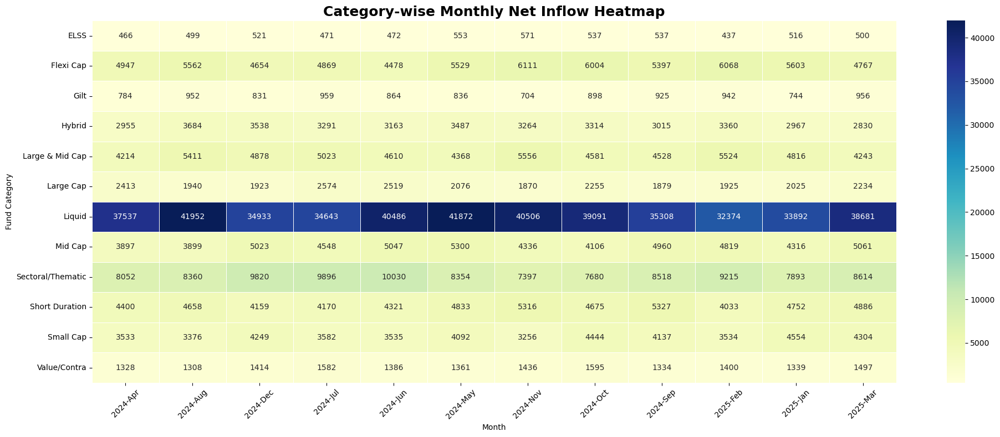

In [78]:
plt.figure(figsize=(20, 8))

# CREATE HEATMAP
sns.heatmap(
    heatmap_data,

    cmap='YlGnBu',

    annot=True,

    fmt='.0f',

    linewidths=0.5
)

# TITLE
plt.title(
    'Category-wise Monthly Net Inflow Heatmap',
    fontsize=18,
    fontweight='bold'
)

# LABELS
plt.xlabel('Month')
plt.ylabel('Fund Category')

# ROTATE X LABELS
plt.xticks(rotation=45)

# TIGHT LAYOUT
plt.tight_layout()

# SHOW CHART
plt.show()

In [79]:
df=pd.read_csv("C:/Users/user/OneDrive/Desktop/bluestock_mf_capstone/data/raw data/08_investor_transactions.csv")

In [80]:
df

,investor_id,transaction_date,amfi_code,transaction_type,amount_inr,state,city,city_tier,age_group,gender,annual_income_lakh,payment_mode,kyc_status
0,INV003054,2024-01-01,119092,SIP,1834,Telangana,Hyderabad,T30,56+,Female,77.1,UPI,Verified
1,INV002952,2024-01-01,148567,Redemption,392882,Punjab,Amritsar,B30,18-25,Male,7.1,Cheque,Verified
2,INV003420,2024-01-01,118636,SIP,912,Haryana,Faridabad,B30,36-45,Male,47.2,Mandate,Verified
3,INV003436,2024-01-01,118634,SIP,1102,Maharashtra,Mumbai,T30,36-45,Female,54.4,Cheque,Pending
4,INV004691,2024-01-01,119094,Lumpsum,8682,Delhi,Noida,T30,26-35,Male,14.5,Net Banking,Pending
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32773,INV003340,2025-05-30,101207,Lumpsum,168029,Madhya Pradesh,Indore,T30,26-35,Male,22.5,Net Banking,Verified
32774,INV001838,2025-05-30,119093,SIP,2175,Uttar Pradesh,Kanpur,B30,46-55,Male,27.6,Mandate,Verified
32775,INV000074,2025-05-30,120504,SIP,25998,Rajasthan,Jaipur,T30,26-35,Female,8.4,UPI,Verified
32776,INV002929,2025-05-30,148568,SIP,459,West Bengal,Kolkata,T30,26-35,Male,13.0,Mandate,Verified


In [81]:
df.columns = df.columns.str.strip()


In [82]:
age_counts = df['age_group'].value_counts()

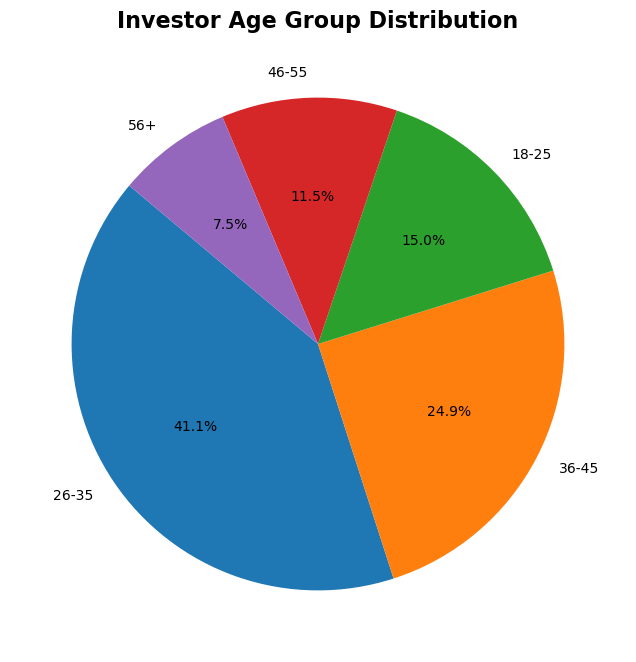

In [83]:
plt.figure(figsize=(8,8))

plt.pie(
    age_counts,

    labels=age_counts.index,

    autopct='%1.1f%%',

    startangle=140
)

# TITLE
plt.title(
    'Investor Age Group Distribution',
    fontsize=16,
    fontweight='bold'
)

plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_8128\620388308.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



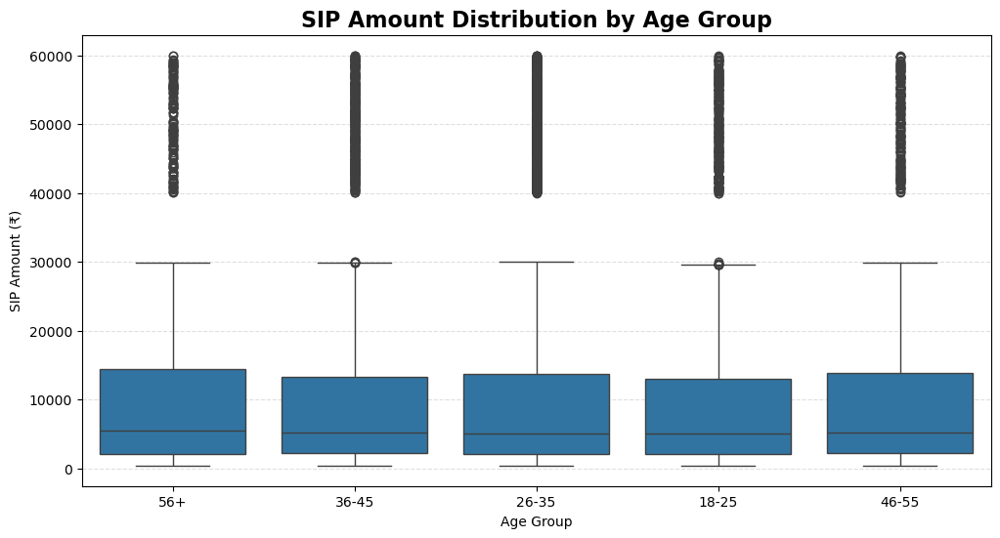

In [84]:
# FILTER ONLY SIP TRANSACTIONS
sip_df = df[
    df['transaction_type'] == 'SIP'
]

# CONVERT AMOUNT TO NUMERIC
sip_df['amount_inr'] = pd.to_numeric(
    sip_df['amount_inr'],
    errors='coerce'
)

# BOX PLOT
plt.figure(figsize=(12,6))

sns.boxplot(
    data=sip_df,
    x='age_group',
    y='amount_inr'
)

# TITLE
plt.title(
    'SIP Amount Distribution by Age Group',
    fontsize=16,
    fontweight='bold'
)

# LABELS
plt.xlabel('Age Group')
plt.ylabel('SIP Amount (₹)')

# GRID
plt.grid(
    axis='y',
    linestyle='--',
    alpha=0.4
)

plt.show()

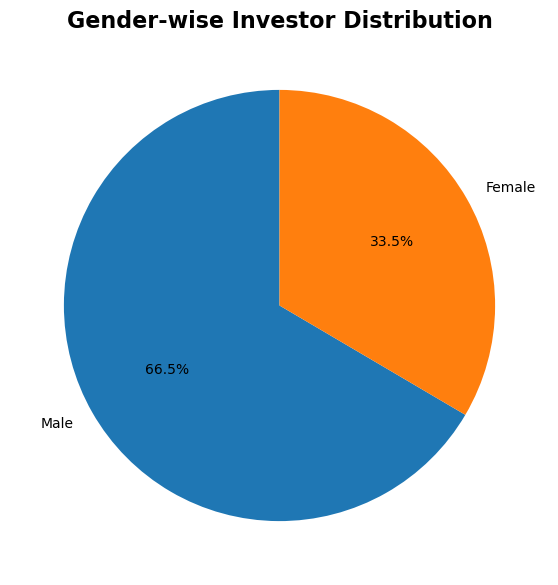

In [85]:
# GENDER COUNTS
gender_counts = df['gender'].value_counts()

# PIE CHART
plt.figure(figsize=(7,7))

plt.pie(
    gender_counts,

    labels=gender_counts.index,

    autopct='%1.1f%%',

    startangle=90
)

# TITLE
plt.title(
    'Gender-wise Investor Distribution',
    fontsize=16,
    fontweight='bold'
)

plt.show()

In [86]:
df

,investor_id,transaction_date,amfi_code,transaction_type,amount_inr,state,city,city_tier,age_group,gender,annual_income_lakh,payment_mode,kyc_status
0,INV003054,2024-01-01,119092,SIP,1834,Telangana,Hyderabad,T30,56+,Female,77.1,UPI,Verified
1,INV002952,2024-01-01,148567,Redemption,392882,Punjab,Amritsar,B30,18-25,Male,7.1,Cheque,Verified
2,INV003420,2024-01-01,118636,SIP,912,Haryana,Faridabad,B30,36-45,Male,47.2,Mandate,Verified
3,INV003436,2024-01-01,118634,SIP,1102,Maharashtra,Mumbai,T30,36-45,Female,54.4,Cheque,Pending
4,INV004691,2024-01-01,119094,Lumpsum,8682,Delhi,Noida,T30,26-35,Male,14.5,Net Banking,Pending
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32773,INV003340,2025-05-30,101207,Lumpsum,168029,Madhya Pradesh,Indore,T30,26-35,Male,22.5,Net Banking,Verified
32774,INV001838,2025-05-30,119093,SIP,2175,Uttar Pradesh,Kanpur,B30,46-55,Male,27.6,Mandate,Verified
32775,INV000074,2025-05-30,120504,SIP,25998,Rajasthan,Jaipur,T30,26-35,Female,8.4,UPI,Verified
32776,INV002929,2025-05-30,148568,SIP,459,West Bengal,Kolkata,T30,26-35,Male,13.0,Mandate,Verified


In [88]:
sip_df = df[
    df['transaction_type'] == 'SIP']

In [89]:
sip_df['amount_inr'] = pd.to_numeric(
    sip_df['amount_inr'],
    errors='coerce'
)

C:\Users\user\AppData\Local\Temp\ipykernel_8128\1174008800.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [90]:
sip_df = sip_df.dropna(subset=['amount_inr'])

# STATE-WISE SIP TOTAL
state_sip = (
    sip_df.groupby('state')['amount_inr']
    .sum()
    .sort_values(ascending=False)
    .head(10)
)

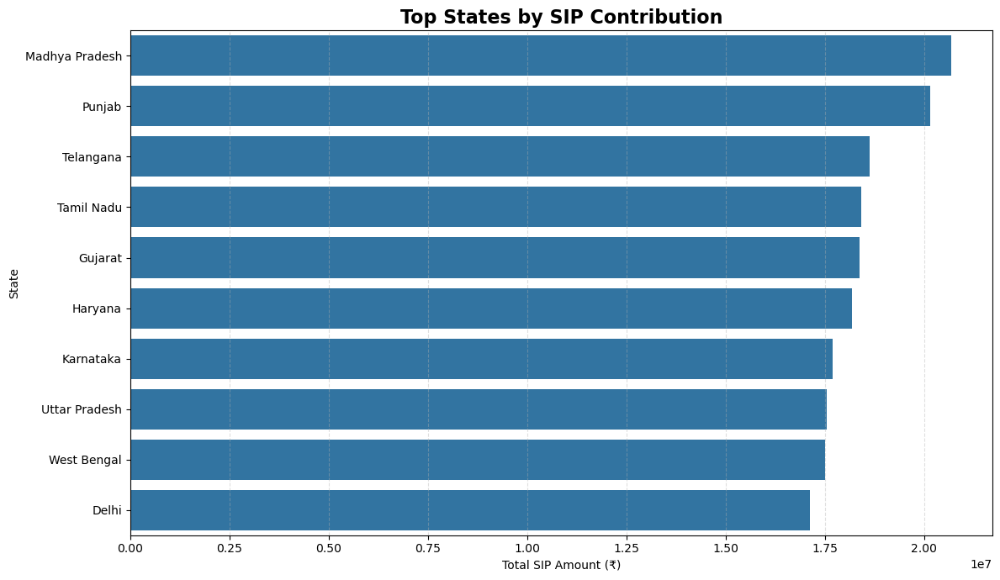

In [91]:
plt.figure(figsize=(12,7))

# HORIZONTAL BAR CHART
sns.barplot(
    x=state_sip.values,
    y=state_sip.index
)

# TITLE
plt.title(
    'Top States by SIP Contribution',
    fontsize=16,
    fontweight='bold'
)

# LABELS
plt.xlabel('Total SIP Amount (₹)')
plt.ylabel('State')

# GRID
plt.grid(
    axis='x',
    linestyle='--',
    alpha=0.4
)

plt.tight_layout()

plt.show()

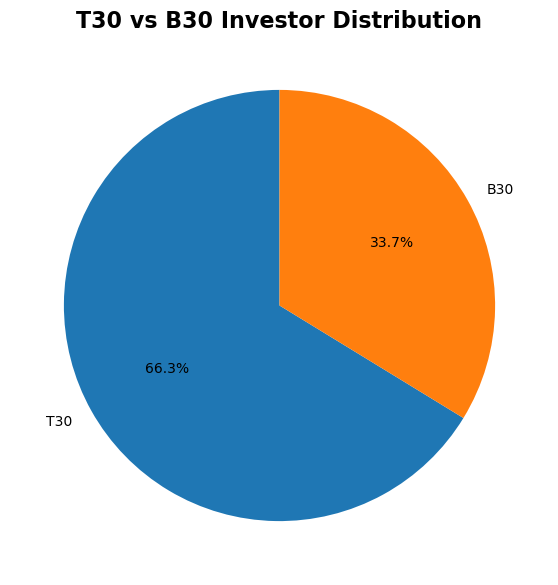

In [92]:
# CITY TIER COUNTS
tier_counts = df['city_tier'].value_counts()

# PIE CHART
plt.figure(figsize=(7,7))

plt.pie(
    tier_counts,

    labels=tier_counts.index,

    autopct='%1.1f%%',

    startangle=90
)

# TITLE
plt.title(
    'T30 vs B30 Investor Distribution',
    fontsize=16,
    fontweight='bold'
)

plt.show()

In [93]:
data = {
    'month': [
        '2022-01',
        '2022-06',
        '2022-12',
        '2023-06',
        '2023-12',
        '2024-06',
        '2024-12',
        '2025-06',
        '2025-12'
    ],

    'folio_count_crore': [
        13.26,
        14.10,
        15.10,
        17.40,
        19.20,
        22.10,
        24.30,
        25.20,
        26.12
    ]
}


In [94]:
df = pd.DataFrame(data)

In [95]:
df['month'] = pd.to_datetime(df['month'])

In [96]:
fig = go.Figure()


In [98]:
fig.add_trace(
    go.Scatter(
        x=df['month'],
        y=df['folio_count_crore'],

        mode='lines+markers',

        name='Folio Count',

        line=dict(width=4),

        marker=dict(size=8)
    )
)
milestones = {
    '2022-01': 13.26,
    '2023-12': 19.20,
    '2025-12': 26.12
}

# ADD ANNOTATIONS
for month, value in milestones.items():

    fig.add_annotation(
        x=pd.to_datetime(month),
        y=value,

        text=f'{value} Cr',

        showarrow=True,

        arrowhead=2,

        ax=-40,
        ay=-50
    )

# LAYOUT
fig.update_layout(
    title='Mutual Fund Folio Count Growth (2022–2025)',

    xaxis_title='Month',

    yaxis_title='Folio Count (Crore)',

    template='plotly_white',

    width=1300,
    height=600
)

# SHOW
fig.show()

In [105]:
df=pd.read_csv("C:/Users/user/OneDrive/Desktop/bluestock_mf_capstone/data/raw data/02_nav_history.csv")
df

,amfi_code,date,nav
0,119551,2022-01-03,54.3856
1,119551,2022-01-04,54.3474
2,119551,2022-01-05,54.6869
3,119551,2022-01-06,55.4550
4,119551,2022-01-07,55.3692
...,...,...,...
45995,149324,2026-05-25,292.4810
45996,149324,2026-05-26,291.2707
45997,149324,2026-05-27,288.8007
45998,149324,2026-05-28,280.6873


In [107]:
df['date'] = pd.to_datetime(
    df['date'],
    format='mixed',
    dayfirst=True,
    errors='coerce'
)


In [108]:
df = df.dropna(subset=['date'])

In [109]:
df['nav'] = pd.to_numeric(
    df['nav'],
    errors='coerce'
)


In [110]:
df = df.dropna(subset=['nav'])

In [111]:
selected_funds = df['amfi_code'].unique()[:10]


In [112]:
filtered_df = df[
    df['amfi_code'].isin(selected_funds)
]

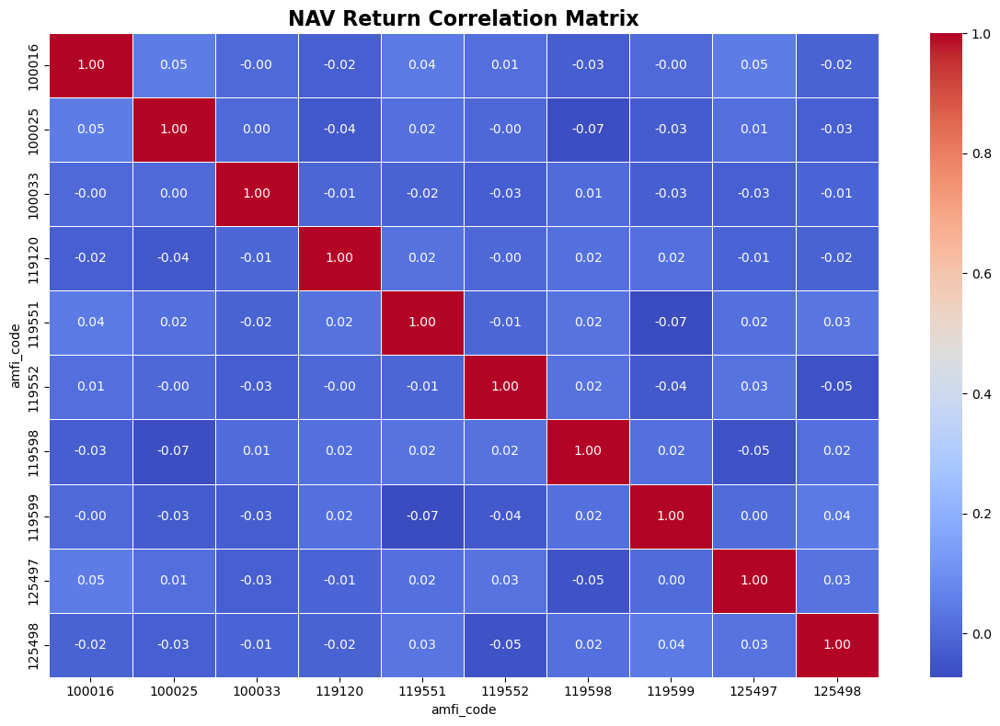

In [113]:
nav_pivot = filtered_df.pivot_table(
    index='date',
    columns='amfi_code',
    values='nav'
)

# DAILY RETURNS
daily_returns = nav_pivot.pct_change().dropna()

# CORRELATION MATRIX
corr_matrix = daily_returns.corr()

# PLOT
plt.figure(figsize=(12,8))

sns.heatmap(
    corr_matrix,

    annot=True,

    cmap='coolwarm',

    fmt='.2f',

    linewidths=0.5
)

plt.title(
    'NAV Return Correlation Matrix',
    fontsize=16,
    fontweight='bold'
)

plt.tight_layout()
plt.show()

In [114]:
df=pd.read_csv("C:/Users/user/OneDrive/Desktop/bluestock_mf_capstone/data/raw data/09_portfolio_holdings.csv")

In [115]:
df

,amfi_code,stock_symbol,stock_name,sector,weight_pct,market_value_cr,current_price_inr,portfolio_date
0,119551,POWERGRID,Power Grid Corporation,Utilities,13.85,737.09,6011.08,2025-12-31
1,119551,HDFCBANK,HDFC Bank Ltd,Banking,11.19,88.97,1074.65,2025-12-31
2,119551,GRASIM,Grasim Industries Ltd,Diversified,9.90,208.45,5964.59,2025-12-31
3,119551,DRREDDY,Dr. Reddy's Laboratories,Pharma,4.76,161.32,3748.82,2025-12-31
4,119551,ASIANPAINT,Asian Paints Ltd,Paints,10.25,725.90,1321.45,2025-12-31
...,...,...,...,...,...,...,...,...
317,149324,DIVISLAB,Divi's Laboratories,Pharma,9.54,855.88,7453.05,2025-12-31
318,149324,BHARTIARTL,Bharti Airtel Ltd,Telecom,1.79,969.71,924.41,2025-12-31
319,149324,TCS,Tata Consultancy Services,IT,13.17,1637.69,1927.89,2025-12-31
320,149324,INDUSINDBK,IndusInd Bank Ltd,Banking,7.63,1387.30,3208.86,2025-12-31


In [116]:
df['weight_pct'] = pd.to_numeric(
    df['weight_pct'],
    errors='coerce'
)


In [117]:
df = df.dropna(subset=['weight_pct'])

In [118]:
sector_weights = (
    df.groupby('sector')['weight_pct']
    .sum()
    .sort_values(ascending=False)
)

In [119]:
sector_weights = sector_weights.head(10)


In [120]:
plt.figure(figsize=(10,10))

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

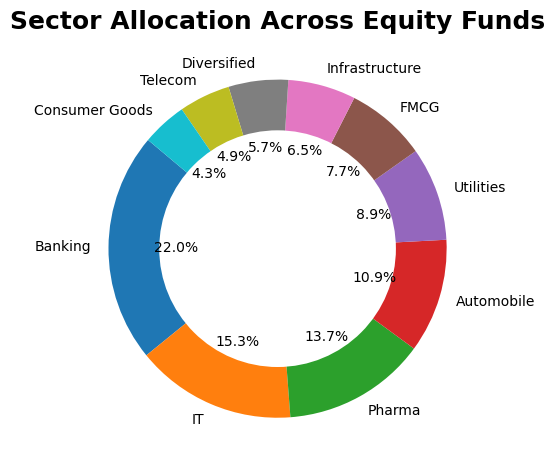

In [121]:
wedges, texts, autotexts = plt.pie(
    sector_weights,

    labels=sector_weights.index,

    autopct='%1.1f%%',

    startangle=140,

    wedgeprops=dict(width=0.4)
)

# CENTER CIRCLE
centre_circle = plt.Circle(
    (0,0),
    0.70,
    fc='white'
)

fig = plt.gcf()

fig.gca().add_artist(centre_circle)

# TITLE
plt.title(
    'Sector Allocation Across Equity Funds',
    fontsize=18,
    fontweight='bold'
)

# SHOW
plt.tight_layout()

plt.show()